In [36]:
import pandas as pd
import seaborn as sns
import re
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

In [37]:
id_season = {
        578: 2023,
        489: 2022,
        418: 2021,
        363: 2020,
        274: 2019,
        210: 2018,
        79: 2017,
        54: 2016,
        42: 2015,
        27: 2014,
        22: 2013,
        21: 2012,
        20: 2011,
        19: 2010,
        18: 2009,
        17: 2008,
        16: 2007,
        15: 2006,
        14: 2005,
        13: 2004,
        12: 2003,
        11: 2002,
        10: 2001,
        9: 2000,
        8: 1999,
        7: 1998,
        6: 1997,
        5: 1996,
        4: 1995,
        3: 1994,
        2: 1993,
        1: 1992}

In [38]:
path = '../../parsers/official/data/player_stat.csv'
df = pd.read_csv(Path(path).resolve())
pd.set_option('display.max_columns', None)
df.head()

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,nationalTeam_isoCode,nationalTeam_country,nationalTeam_demonym,birth_date_millis,birth_date_label,birth_country_isoCode,birth_country_country,birth_country_demonym,birth_place,age,name_display,name_first,name_middle,name_last,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card
0,578,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 11 days,Max Aarons,Max,James,Aarons,19970.0,156.0,14.0,3.0,3.0,120.0,3.0,17.0,273.0,1.0,84.0,9.0,4.0,13.0,6.0,125.0,55.0,1.0,5.0,1.0,1.0,1.0,1.0,83.0,64.0,1.0,6.0,4.0,1.0,11.0,1.0,7.0,3.0,6.0,3.0,45.0,61.0,6.0,15.0,2.0,46.0,6.0,10.0,152.0,11.0,26.0,23.0,3.0,2.0,24.0,5.0,1.0,5.0,96.0,48.0,27.0,8.0,10.0,997.0,3.0,2.0,4.0,352.0,5.0,4.0,11.0,98.0,1.0,24.0,2.0,138.0,138.0,5.0,40.0,19.0,21.0,31.0,66.0,263.0,4.0,15.0,6.0,196.0,33.0,15.0,19.0,10.0,10.0,99.0,1.0,176.0,15.0,41.0,2.0,362.0,1.0,1.0,3.0,2.0,25.0,2.0,97.0,604.0,10.0,9.0,9.0,22.0,0.0,2.0,10.0,2.0,16.0,1.0
1,418,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 11 days,Max Aarons,Max,James,Aarons,19970.0,461.0,23.0,9.0,9.0,395.0,10.0,36.0,847.0,2.0,251.0,50.0,14.0,34.0,5.0,336.0,179.0,6.0,17.0,8.0,1.0,6.0,13.0,219.0,154.0,2.0,25.0,60.0,6.0,18.0,4.0,33.0,17.0,23.0,6.0,151.0,163.0,25.0,71.0,32.0,134.0,6.0,27.0,456.0,32.0,69.0,62.0,7.0,32.0,47.0,28.0,4.0,28.0,367.0,157.0,71.0,24.0,39.0,2882.0,15.0,10.0,10.0,1080.0,19.0,13.0,11.0,335.0,2.0,93.0,6.0,470.0,470.0,5.0,110.0,39.0,60.0,55.0,211.0,833.0,20.0,57.0,20.0,555.0,80.0,71.0,68.0,50.0,50.0,308.0,2.0,592.0,67.0,141.0,1.0,1097.0,1.0,13.0,3.0,2.0,64.0,5.0,315.0,1962.0,26.0,38.0,38.0,52.0,0.0,4.0,34.0,12.0,44.0,8.0
2,274,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 11 days,Max Aarons,Max,James,Aarons,19970.0,570.0,23.0,16.0,16.0,502.0,12.0,38.0,1056.0,NaN,260.0,50.0,22.0,36.0,12.0,384.0,188.0,3.0,22.0,3.0,2.0,3.0,13.0,352.0,178.0,7.0,24.0,82.0,6.0,18.0,5.0,56.0,17.0,31.

In [39]:
df.shape

(2434, 133)

In [40]:
#Удаляем колонки в которых информация дублируется либо информация бесполезна
df.drop(['nationalTeam_isoCode',
         'nationalTeam_demonym',
         'nationalTeam_country', 
         'birth_country_isoCode', 
         'birth_country_demonym',
         'birth_date_millis',
         'name_first',
         'name_middle',
         'name_last'
         ], axis=1, inplace=True)

In [41]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2434 entries, 0 to 2433
Data columns (total 124 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    season_id                       2434 non-null   int64  
 1    playerId                        2434 non-null   float64
 2    info_position                   2434 non-null   object 
 3    info_shirtNum                   2188 non-null   float64
 4    info_positionInfo               2434 non-null   object 
 5    info_loan                       2434 non-null   bool   
 6    birth_date_label                2434 non-null   object 
 7    birth_country_country           2434 non-null   object 
 8    birth_place                     1573 non-null   object 
 9    age                             2434 non-null   object 
 10   name_display                    2434 non-null   object 
 11   id                              2434 non-null   float64
 12   _accurate_back_zon

In [42]:
col = df.columns
for i in col:
    if df[i].dtypes == float:
        print(f'{i}: mean: {int(df[i].mean())}, min: {df[i].min()}, max: {df[i].max()}, na: {df[i].isna().sum()}')

playerId: mean: 256464, min: 6011.0, max: 355602.0, na: 0
info_shirtNum: mean: 16, min: 1.0, max: 98.0, na: 246
id: mean: 21563, min: 2100.0, max: 140364.0, na: 0
_accurate_back_zone_pass: mean: 282, min: 0.0, max: 2008.0, na: 69
_accurate_chipped_pass: mean: 30, min: 0.0, max: 252.0, na: 241
_accurate_cross: mean: 10, min: 0.0, max: 135.0, na: 878
_accurate_cross_nocorner: mean: 7, min: 0.0, max: 70.0, na: 897
_accurate_fwd_zone_pass: mean: 303, min: 0.0, max: 1707.0, na: 70
_accurate_launches: mean: 10, min: 0.0, max: 219.0, na: 788
_accurate_long_balls: mean: 46, min: 0.0, max: 410.0, na: 235
_accurate_pass: mean: 571, min: 0.0, max: 2903.0, na: 43
_accurate_through_ball: mean: 2, min: 0.0, max: 23.0, na: 1477
_accurate_throws: mean: 35, min: 0.0, max: 460.0, na: 674
_aerial_lost: mean: 26, min: 0.0, max: 245.0, na: 276
_aerial_won: mean: 26, min: 0.0, max: 240.0, na: 253
_appearances: mean: 20, min: 0.0, max: 38.0, na: 18
_attempted_tackle_foul: mean: 10, min: 0.0, max: 48.0, na: 3

In [43]:
df['season'] = df['season_id'].apply(lambda x: id_season[x])

In [44]:
#Возраст у игрока в каждом сезоне одинаковый, исправим это
df['age'] = df['season'] - df['birth_date_label'].apply(lambda x: int(x.split()[-1]))

In [45]:
df.shape

(2434, 125)

In [46]:
#Удалим строки с большим количеством пропусков
"""df.dropna(thresh=62, inplace=True)
df.shape"""

'df.dropna(thresh=62, inplace=True)\ndf.shape'

In [47]:
#Удалим колонки, в которых  более 30% пропусков
"""df.dropna(thresh=1700, axis=1, inplace=True)
df.shape"""

'df.dropna(thresh=1700, axis=1, inplace=True)\ndf.shape'

In [48]:
df.columns

Index(['season_id', 'playerId', 'info_position', 'info_shirtNum',
       'info_positionInfo', 'info_loan', 'birth_date_label',
       'birth_country_country', 'birth_place', 'age',
       ...
       '_turnover', '_unsuccessful_touch', '_was_fouled', '_winning_goal',
       '_wins', '_won_contest', '_won_corners', '_won_tackle', '_yellow_card',
       'season'],
      dtype='object', length=125)

In [49]:
df[['_wins', '_losses', '_game_started', '_draws', '_appearances']] #appearances = wins + losses + draws

,_wins,_losses,_game_started,_draws,_appearances
0,2.0,8.0,11.0,3.0,13.0
1,4.0,24.0,32.0,6.0,34.0
2,4.0,26.0,36.0,6.0,36.0
3,5.0,11.0,24.0,8.0,24.0
4,4.0,4.0,7.0,1.0,9.0
5,11.0,11.0,23.0,3.0,25.0
6,5.0,15.0,33.0,13.0,33.0
7,4.0,12.0,11.0,4.0,20.0
8,6.0,5.0,13.0,6.0,17.0
9,1.0,1.0,3.0,1.0,3.0


In [50]:
df[['_wins', '_losses', '_game_started', '_draws', '_appearances']].isna().sum()

_wins            177
_losses          169
_game_started    232
_draws           302
_appearances      18
dtype: int64

In [51]:
df_temp = df[['_wins', '_losses', '_draws', '_appearances']]
df_temp['sum_'] = df_temp['_losses'].fillna(0) + df_temp['_draws'].fillna(0) + df_temp['_wins'].fillna(0)
df_temp

/tmp/ipykernel_13189/807101919.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['sum_'] = df_temp['_losses'].fillna(0) + df_temp['_draws'].fillna(0) + df_temp['_wins'].fillna(0)


,_wins,_losses,_draws,_appearances,sum_
0,2.0,8.0,3.0,13.0,13.0
1,4.0,24.0,6.0,34.0,34.0
2,4.0,26.0,6.0,36.0,36.0
3,5.0,11.0,8.0,24.0,24.0
4,4.0,4.0,1.0,9.0,9.0
5,11.0,11.0,3.0,25.0,25.0
6,5.0,15.0,13.0,33.0,33.0
7,4.0,12.0,4.0,20.0,20.0
8,6.0,5.0,6.0,17.0,17.0
9,1.0,1.0,1.0,3.0,3.0


In [52]:
#Проверим гипотезу, что наны в этих колонка - нули
df_temp[df_temp['_appearances'] != df_temp['sum_']]

,_wins,_losses,_draws,_appearances,sum_
23,NaN,NaN,NaN,NaN,0.0
108,8.0,17.0,4.0,30.0,29.0
139,8.0,7.0,8.0,24.0,23.0
241,NaN,NaN,NaN,NaN,0.0
261,5.0,3.0,2.0,11.0,10.0
310,NaN,NaN,NaN,NaN,0.0
388,NaN,NaN,NaN,NaN,0.0
394,10.0,17.0,4.0,32.0,31.0
475,NaN,NaN,NaN,NaN,0.0
508,NaN,NaN,NaN,NaN,0.0


В нескольких строках наша гипотезу не подтвердилась, но разница везде в 1 матч, видимо это ошибка в данных. Но самое главное нет ни одной строки с нанами, которые мы заменили на нули, поэтому смело меняем наны в этих колонках на нули

In [53]:
df[['_wins', '_losses', '_draws', '_appearances']] = df[['_wins', '_losses', '_draws', '_appearances']].fillna(0)

In [54]:
df['per_wins'] = df['_wins'] / df['_appearances']

In [55]:
df[['_wins', '_losses', '_draws', '_appearances']].loc[4]

_wins           4.0
_losses         4.0
_draws          1.0
_appearances    9.0
Name: 4, dtype: float64

In [56]:
df.head()

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,birth_date_label,birth_country_country,birth_place,age,name_display,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
0,578,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,23,Max Aarons,19970.0,156.0,14.0,3.0,3.0,120.0,3.0,17.0,273.0,1.0,84.0,9.0,4.0,13.0,6.0,125.0,55.0,1.0,5.0,1.0,1.0,1.0,1.0,83.0,64.0,1.0,6.0,4.0,1.0,11.0,1.0,7.0,3.0,6.0,3.0,45.0,61.0,6.0,15.0,2.0,46.0,6.0,10.0,152.0,11.0,26.0,23.0,3.0,2.0,24.0,5.0,1.0,5.0,96.0,48.0,27.0,8.0,10.0,997.0,3.0,2.0,4.0,352.0,5.0,4.0,11.0,98.0,1.0,24.0,2.0,138.0,138.0,5.0,40.0,19.0,21.0,31.0,66.0,263.0,4.0,15.0,6.0,196.0,33.0,15.0,19.0,10.0,10.0,99.0,1.0,176.0,15.0,41.0,2.0,362.0,1.0,1.0,3.0,2.0,25.0,2.0,97.0,604.0,10.0,9.0,9.0,22.0,0.0,2.0,10.0,2.0,16.0,1.0,2023,0.153846
1,418,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,21,Max Aarons,19970.0,461.0,23.0,9.0,9.0,395.0,10.0,36.0,847.0,2.0,251.0,50.0,14.0,34.0,5.0,336.0,179.0,6.0,17.0,8.0,1.0,6.0,13.0,219.0,154.0,2.0,25.0,60.0,6.0,18.0,4.0,33.0,17.0,23.0,6.0,151.0,163.0,25.0,71.0,32.0,134.0,6.0,27.0,456.0,32.0,69.0,62.0,7.0,32.0,47.0,28.0,4.0,28.0,367.0,157.0,71.0,24.0,39.0,2882.0,15.0,10.0,10.0,1080.0,19.0,13.0,11.0,335.0,2.0,93.0,6.0,470.0,470.0,5.0,110.0,39.0,60.0,55.0,211.0,833.0,20.0,57.0,20.0,555.0,80.0,71.0,68.0,50.0,50.0,308.0,2.0,592.0,67.0,141.0,1.0,1097.0,1.0,13.0,3.0,2.0,64.0,5.0,315.0,1962.0,26.0,38.0,38.0,52.0,0.0,4.0,34.0,12.0,44.0,8.0,2021,0.117647
2,274,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,19,Max Aarons,19970.0,570.0,23.0,16.0,16.0,502.0,12.0,38.0,1056.0,NaN,260.0,50.0,22.0,36.0,12.0,384.0,188.0,3.0,22.0,3.0,2.0,3.0,13.0,352.0,178.0,7.0,24.0,82.0,6.0,18.0,5.0,56.0,17.0,31.0,6.0,175.0,167.0,24.0,73.0,28.0,112.0,13.0,29.0,476.0,36.0,71.0,63.0,8.0,28.0,62.0,37.0,10.0,37.0,456.0,130.0,53.0,26.0,40.0,3240.0,7.0,13.0,10.0,1316.0,29.0,14.0,24.0,410.0,NaN,77.0,4.0,530.0,530.0,5.0,126.0,47.0,82.0,55.0,250.0,1035.0,17.0,NaN,23.0,694.0,78.0,73.0,99.0,73.0,73.0,331.0,3.0,718.0,93.0,153.0,3.0,1339.0,4.0,14.0,NaN,NaN,48.0,NaN,299.0,2275.0,

Теперь наша гипотеза, что все наны в датасете являются нулями. Для начала сгруппируем датасет по сезонам и посмотрим есть ли зависимость года от пропусков

In [57]:
df_gr = df.groupby(by='season_id').agg(['count', 'size'])
df_gr

playerId      info_position      info_shirtNum       \
             count size         count size         count size   
season_id                                                       
27              76   76            76   76            66   76   
42             101  101           101  101            90  101   
54             112  112           112  112           102  112   
79             153  153           153  153           137  153   
210            191  191           191  191           171  191   
274            248  248           248  248           220  248   
363            300  300           300  300           269  300   
418            340  340           340  340           308  340   
489            437  437           437  437           395  437   
578            476  476           476  476           430  476   

          info_positionInfo      info_loan      birth_date_label       \
                      count size     count size            count size   
season_id                                                               
27                       76   76        76   76               76   76   
42                      101  101       101  101              101  101   
54                      112  112       112  112              112  112   
79                      153  153       153  153              153  153   
210                     191  191       191  191              191  191   
274                     248  248       248  248              248  248   
363                     300  300       300  300              300  300   
418                     340  340       340  340              340  340   
489                     437  437       437  437              437  437   
578                     476  476       476  476              476  476   

          birth_country_country      birth_place        age      name_display  \
                          count size       count size count size        count   
season_id                                                                       
27                           76   76          47   76    76   76           76   
42                          101  101          68  101   101  101          101   
54                          112  112          79  112   112  112          112   
79                          153  153         104  153   153  153          153   
210                         191  191         126  191   191  191          191   
274                         248  248         160  248   248  248          248   
363                         300  300         196  300   300  300          300   
418                         340  340         228  340   340  340          340   
489                         437  437         282  437   437  437          437   
578                         476  476         283  476   476  476          476   

                  id      _accurate_back_zone_pass       \
          size count size                    count size   
season_id                                                 
27          76    76   76                       69   76   
42         101   101  101                       91  101   
54         112   112  112                      111  112   
79         153   153  153                      151  153   
210        191   191  191                      185  191   
274        248   248  248                      246  248   
363        300   300  300                      291  300   
418        340   340  340                      332  340   
489        437   437  437                      426  437   
578        476   476  476                      463  476   

          _accurate_chipped_pass      _accurate_cross       \
                           count size           count size   
season_id                                                    
27                            64   76              45   76   
42                            86  101              65  101   
54                           107  112              82  112   
79                  

In [58]:
#Не знаю как тут обойтись без цикла, в цикле считаем отношение размера признака от количества данных (1.0 - пропусков нет), записываем информацию в count
for i in range(0, df_gr.shape[1], 2):
    df_gr.iloc[:, i] = df_gr.iloc[:, i] / df_gr.iloc[:, i+1]

df_gr

playerId      info_position      info_shirtNum       \
             count size         count size         count size   
season_id                                                       
27             1.0   76           1.0   76      0.868421   76   
42             1.0  101           1.0  101      0.891089  101   
54             1.0  112           1.0  112      0.910714  112   
79             1.0  153           1.0  153      0.895425  153   
210            1.0  191           1.0  191      0.895288  191   
274            1.0  248           1.0  248      0.887097  248   
363            1.0  300           1.0  300      0.896667  300   
418            1.0  340           1.0  340      0.905882  340   
489            1.0  437           1.0  437      0.903890  437   
578            1.0  476           1.0  476      0.903361  476   

          info_positionInfo      info_loan      birth_date_label       \
                      count size     count size            count size   
season_id                                                               
27                      1.0   76       1.0   76              1.0   76   
42                      1.0  101       1.0  101              1.0  101   
54                      1.0  112       1.0  112              1.0  112   
79                      1.0  153       1.0  153              1.0  153   
210                     1.0  191       1.0  191              1.0  191   
274                     1.0  248       1.0  248              1.0  248   
363                     1.0  300       1.0  300              1.0  300   
418                     1.0  340       1.0  340              1.0  340   
489                     1.0  437       1.0  437              1.0  437   
578                     1.0  476       1.0  476              1.0  476   

          birth_country_country      birth_place        age      name_display  \
                          count size       count size count size        count   
season_id                                                                       
27                          1.0   76    0.618421   76   1.0   76          1.0   
42                          1.0  101    0.673267  101   1.0  101          1.0   
54                          1.0  112    0.705357  112   1.0  112          1.0   
79                          1.0  153    0.679739  153   1.0  153          1.0   
210                         1.0  191    0.659686  191   1.0  191          1.0   
274                         1.0  248    0.645161  248   1.0  248          1.0   
363                         1.0  300    0.653333  300   1.0  300          1.0   
418                         1.0  340    0.670588  340   1.0  340          1.0   
489                         1.0  437    0.645309  437   1.0  437          1.0   
578                         1.0  476    0.594538  476   1.0  476          1.0   

                  id      _accurate_back_zone_pass       \
          size count size                    count size   
season_id                                                 
27          76   1.0   76                 0.907895   76   
42         101   1.0  101                 0.900990  101   
54         112   1.0  112                 0.991071  112   
79         153   1.0  153                 0.986928  153   
210        191   1.0  191                 0.968586  191   
274        248   1.0  248                 0.991935  248   
363        300   1.0  300                 0.970000  300   
418        340   1.0  340                 0.976471  340   
489        437   1.0  437                 0.974828  437   
578        476   1.0  476                 0.972689  476   

          _accurate_chipped_pass      _accurate_cross       \
                           count size           count size   
season_id                                                    
27                      0.842105   76        0.592105   76   
42                      0.851485  101        0.643564  101   
54                      0.955357  112        0.732143  112   
79                  

Зависимости в в соотношении пропущеных значений по сезонам не выявлено, только в 3 колонках есть сильное различие :
_winning_goal
_attempts_obox
_times_tackled

In [59]:
(df['_winning_goal']==0).sum()

1350

In [60]:
df['_attempts_obox'].isna().sum()

821

In [61]:
df['_times_tackled'].isna().sum()

587

In [62]:
df[df['info_shirtNum'].isna()]

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,birth_date_label,birth_country_country,birth_place,age,name_display,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
17,578,351454.0,M,NaN,Midfielder,False,29 March 2002,France,Marseille,21,Naouirou Ahamada,68086.0,15.0,1.0,NaN,NaN,40.0,NaN,1.0,55.0,NaN,1.0,NaN,2.0,10.0,4.0,19.0,8.0,3.0,1.0,NaN,2.0,3.0,3.0,12.0,14.0,NaN,NaN,0.0,2.0,4.0,NaN,4.0,1.0,4.0,2.0,13.0,10.0,NaN,NaN,NaN,3.0,NaN,4.0,18.0,NaN,5.0,4.0,1.0,NaN,2.0,1.0,NaN,1.0,16.0,4.0,4.0,7.0,NaN,124.0,NaN,1.0,NaN,65.0,NaN,NaN,9.0,17.0,NaN,3.0,1.0,25.0,25.0,NaN,6.0,8.0,6.0,20.0,23.0,54.0,0.0,5.0,1.0,19.0,3.0,NaN,4.0,5.0,5.0,29.0,1.0,52.0,1.0,2.0,NaN,66.0,NaN,3.0,NaN,10.0,2.0,NaN,1.0,97.0,1.0,4.0,4.0,4.0,0.0,1.0,3.0,1.0,2.0,1.0,2023,0.100000
18,489,351454.0,M,NaN,Midfielder,False,29 March 2002,France,Marseille,20,Naouirou Ahamada,68086.0,16.0,NaN,NaN,NaN,21.0,1.0,1.0,37.0,NaN,NaN,1.0,NaN,8.0,1.0,8.0,4.0,NaN,1.0,1.0,NaN,NaN,2.0,8.0,8.0,NaN,NaN,2.0,0.0,2.0,NaN,2.0,NaN,1.0,3.0,7.0,4.0,NaN,NaN,NaN,4.0,NaN,2.0,11.0,NaN,2.0,2.0,NaN,NaN,4.0,NaN,NaN,NaN,19.0,5.0,3.0,5.0,NaN,87.0,NaN,0.0,1.0,43.0,NaN,1.0,5.0,8.0,NaN,1.0,1.0,17.0,17.0,NaN,4.0,4.0,2.0,6.0,10.0,36.0,2.0,2.0,1.0,18.0,NaN,NaN,2.0,2.0,2.0,11.0,1.0,28.0,1.0,2.0,2.0,44.0,NaN,3.0,NaN,8.0,3.0,NaN,NaN,66.0,4.0,5.0,5.0,NaN,0.0,0.0,1.0,1.0,2.0,1.0,2022,0.000000
50,578,30533.0,D,NaN,Right Full Back,False,7 October 1998,England,Liverpool,25,Trent Alexander-Arnold,14732.0,401.0,97.0,36.0,15.0,549.0,7.0,100.0,914.0,7.0,113.0,4.0,7.0,18.0,3.0,113.0,60.0,21.0,26.0,4.0,10.0,19.0,18.0,146.0,131.0,12.0,5.0,10.0,11.0,41.0,4.0,25.0,27.0,6.0,6.0,71.0,61.0,5.0,30.0,8.0,255.0,0.0,5.0,499.0,17.0,15.0,14.0,1.0,8.0,31.0,22.0,2.0,22.0,380.0,264.0,152.0,1.0,10.0,1500.0,4.0,22.0,27.0,1104.0,1.0,2.0,62.0,272.0,NaN,193.0,1.0,402.0,402.0,8.0,60.0,63.0,20.0,132.0,253.0,877.0,10.0,21.0,49.0,437.0,206.0,30.0,37.0,113.0,67.0,403.0,NaN,833.0,56.0,232.0,NaN,1157.0,3.0,29.0,5.0,1.0,26.0,18.0,145.0,1628.0,20.0,22.0,22.0,6.0,1.0,11.0,22.0,20.0,18.0,5.0,2023,0.611111
51,489,30533.0,D,NaN,Right Full Back,False,7 October 1998,England,Liverpool,2

In [63]:
df.describe()

,season_id,playerId,info_shirtNum,age,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
count,2434.000000,2434.000000,2188.000000,2434.000000,2434.000000,2365.000000,2193.000000,1556.000000,1537.000000,2364.000000,1646.000000,2199.000000,2391.000000,957.000000,1760.000000,2158.000000,2181.000000,2434.000000,2046.000000,2361.000000,2324.000000,1613.000000,1991.000000,1652.000000,1416.000000,1716.000000,1884.000000,2225.000000,2332.000000,1483.000000,1483.000000,2139.000000,1807.000000,2098.000000,1707.000000,1786.000000,1657.000000,2028.000000,2434.000000,2286.000000,2315.000000,1483.000000,2206.000000,1973.000000,2311.000000,1529.000000,2118.000000,2356.000000,2202.000000,2277.000000,2266.000000,1877.000000,1974.000000,2171.000000,2054.000000,1302.000000,2054.000000,2342.000000,2279.000000,2236.000000,2434.000000,1966.000000,2415.000000,1197.000000,1798.000000,1954.000000,2396.000000,1717.000000,1404.000000,2290.000000,2304.000000,413.000000,2214.000000,1637.000000,2376.000000,2376.000000,1831.000000,2260.000000,2141.000000,2184.000000,2340.000000,2332.00000,2388.000000,2046.000000,1847.000000,2024.000000,2374.000000,2249.000000,2206.000000,2084.000000,1913.000000,1905.000000,2367.000000,1754.000000,2385.000000,2084.000000,2258.000000,1329.000000,2397.000000,1000.000000,2020.000000,1832.000000,1861.000000,2150.000000,1324.000000,1780.000000,2407.000000,1991.000000,2166.000000,2166.000000,2178.000000,1847.000000,2434.000000,2014.000000,1895.000000,2098.000000,1783.000000,2434.000000,2415.000000
mean,358.394412,256464.987675,16.793419,25.169269,21563.040263,282.178013,30.067487,10.523779,7.116461,303.043993,10.264885,46.482947,571.882058,2.384535,35.677841,26.618628,26.509858,20.449055,10.123656,132.990682,77.345525,10.017979,13.725264,9.062954,4.348870,10.220280,18.412951,118.057079,96.175815,3.737020,4.365475,25.442730,7.446597,15.381792,5.081429,17.605263,10.158721,17.832840,4.611750,82.090989,82.062635,4.365475,32.311423,18.567157,90.940718,5.429039,17.435788,250.671053,18.322888,23.173035,20.261253,3.650506,18.705674,55.531092,18.226874,3.149770,18.226874,181.542272,110.350592,62.

Много пропусков в признаках, где низкие значения (низкое среднее, максимальное), т.е там где должно быть много нулей

<Axes: xlabel='age', ylabel='Count'>

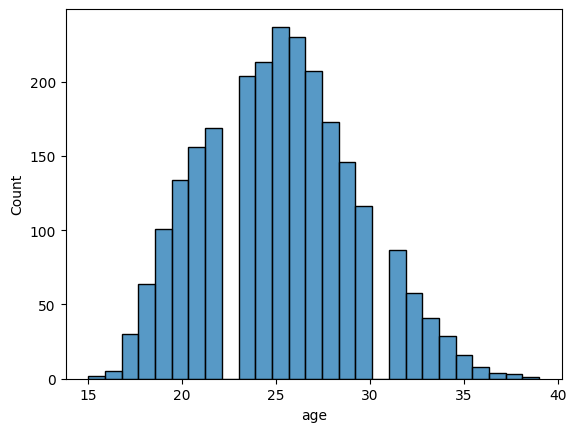

In [64]:
sns.histplot(df['age'])

<Axes: xlabel='info_position', ylabel='Count'>

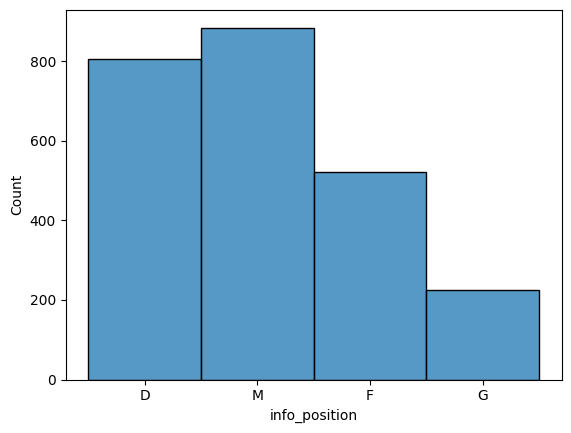

In [65]:
sns.histplot(df['info_position'])

In [66]:
#Топ 10 стран по количеству игроков в лиге
df.groupby(by='birth_country_country')['name_display'].count().sort_values(ascending=False).iloc[:10] 

birth_country_country
England        1038
France          170
Brazil          157
Spain            92
Portugal         87
Germany          68
Netherlands      63
Belgium          62
Ireland          60
Scotland         52
Name: name_display, dtype: int64

In [67]:
pd.set_option('display.max_rows', None)

In [68]:
df.iloc[:, 12:].corr()

,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
_accurate_back_zone_pass,1.000000,0.740075,0.127030,0.124384,0.615061,0.055716,0.566747,0.909128,0.036861,0.149991,0.187932,0.493372,0.574999,0.332767,0.565128,0.505919,0.111896,0.080212,-0.108278,0.118085,0.110174,-0.135813,0.369854,0.658671,0.001359,0.135193,0.249985,-0.047456,0.293551,0.627733,0.066699,0.142486,-0.092765,0.421414,0.172495,0.465638,0.135193,0.657885,0.585140,0.697088,-0.120566,0.341499,0.823205,0.632434,0.524085,0.520744,0.268935,0.582561,0.650030,0.608433,0.444153,0.608433,0.823825,0.657311,0.838355,0.310426,0.547688,0.670353,0.641218,0.074053,0.068202,0.886739,0.612178,-0.106370,0.463037,0.461759,0.167764,0.170029,0.257600,0.421892,0.421845,0.023713,0.772289,0.582729,0.254841,0.812997,0.389950,0.896591,0.273063,-0.059386,0.088346,0.998190,0.739271,0.653451,-0.071887,0.104406,0.097706,0.436082,-0.148906,0.608495,0.210581,0.461402,-0.226392,0.897586,0.011222,0.004926,-0.142053,-0.217969,0.491919,0.075968,0.142503,0.819156,-0.052808,-0.062016,-0.062016,0.110848,-0.006500,0.540165,-0.024762,-0.047112,0.454055,0.359586,-0.087000,0.146619
_accurate_chipped_pass,0.740075,1.000000,0.387004,0.335236,0.610934,0.096092,0.687715,0.758269,0.268928,0.177777,0.109782,0.296082,0.551500,0.394840,0.555530,0.505272,0.388999,0.281175,0.023219,0.376865,0.387453,0.054936,0.372837,0.683352,0.243086,0.155333,0.338858,0.167614,0.440228,0.550043,0.187606,0.396530,0.016825,0.401313,0.188565,0.378125,0.155333,0.431230,0.354060,0.789882,-0.026524,0.348797,0.754781,0.628262,0.521878,0.518609,0.297737,0.352539,0.480097,0.531095,0.314553,0.531095,0.685157,0.629551,0.711012,0.300402,0.423144,0.642116,0.349694,0.352580,0.304275,0.753751,0.424340,-0.033307,0.458851,0.473796,0.057075,0.418364,0.236249,0.542884,0.543281,0.245541,0.643545,0.608312,0.334727,0.652397,0.477892,0.731532,0.356194,-0.030798,0.329369,0.749280,0.969107,0.428384,0.029573,0.357821,0.313490,0.553881,-0.081468,0.661391,0.239348,0.565114,-0.160709,0.787336,0.017925,0.177631,-0.028616,-0.229208,0.470423,0.319495,0.170721,0.752003,0.003007,0.015921,0.015921,0.147138,0.020496,0.473437,

/home/chewye/Documents/hse_movs/proj/.venv/lib/python3.10/site-packages/seaborn/axisgrid.py:1280: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


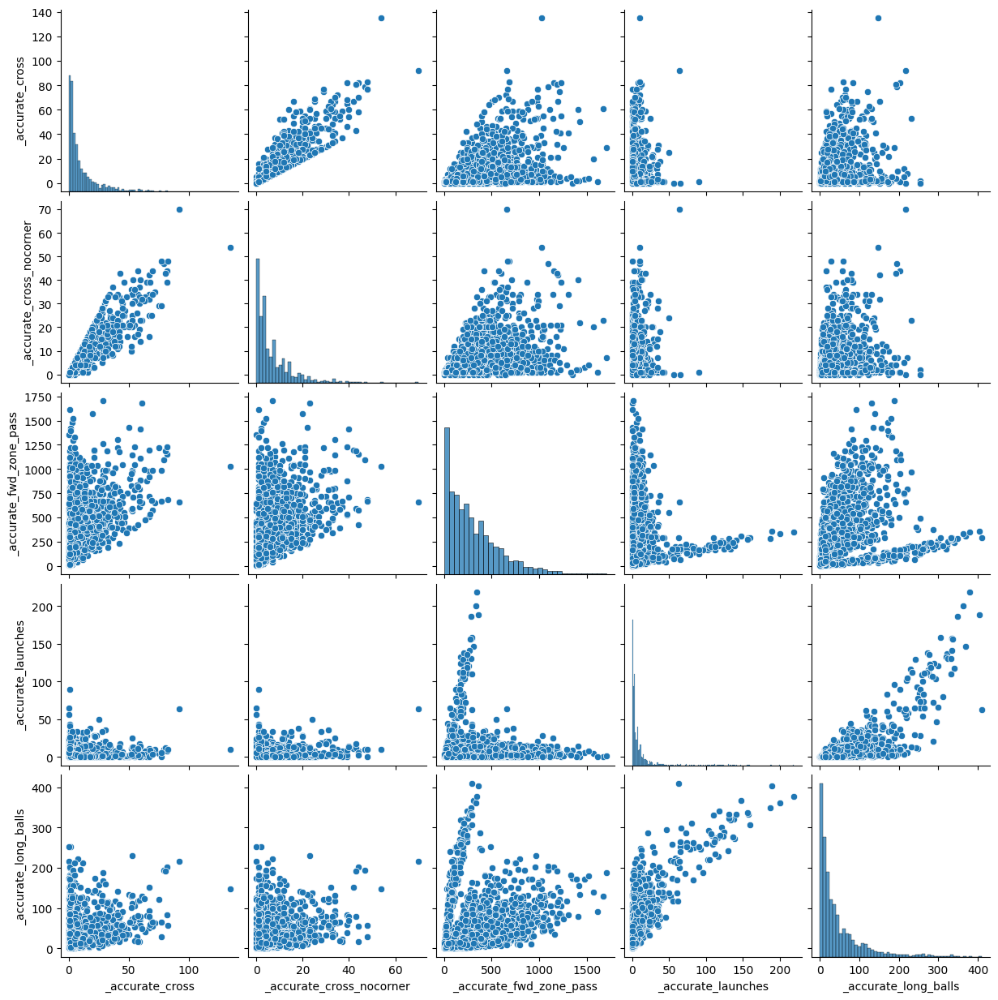

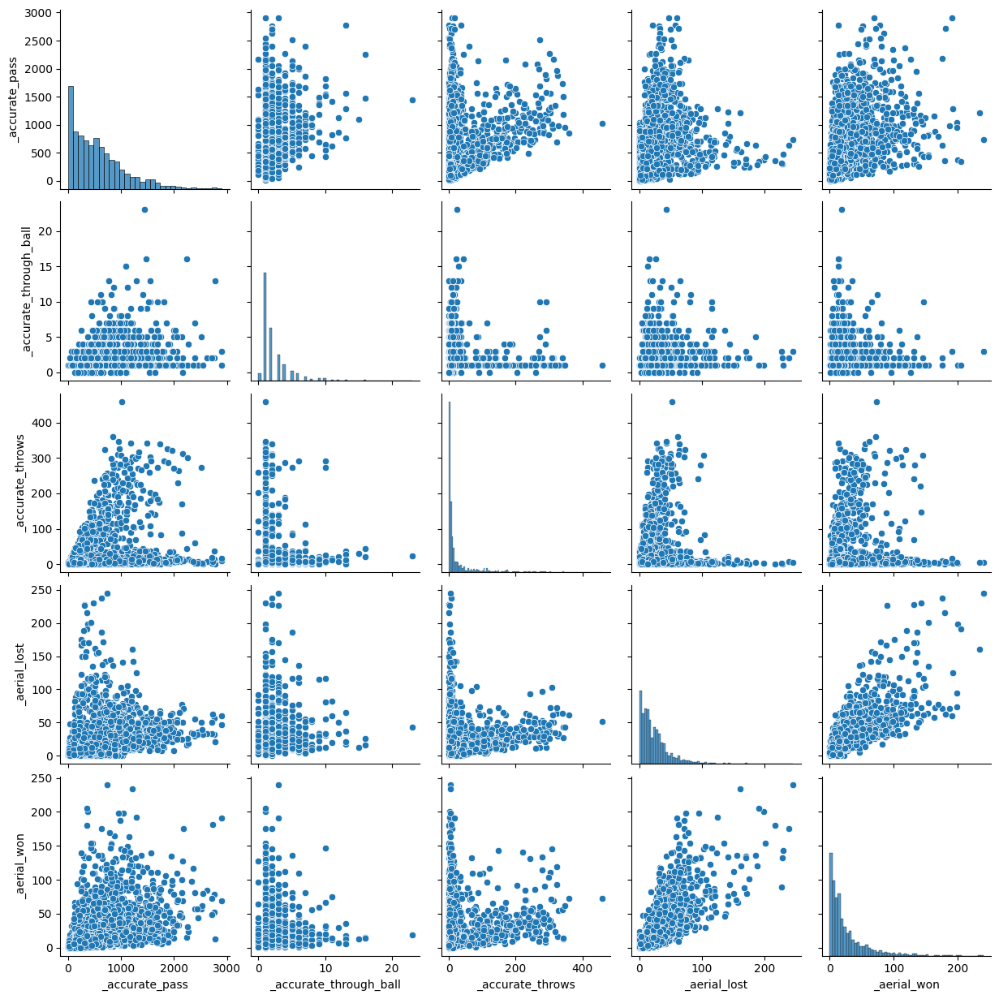

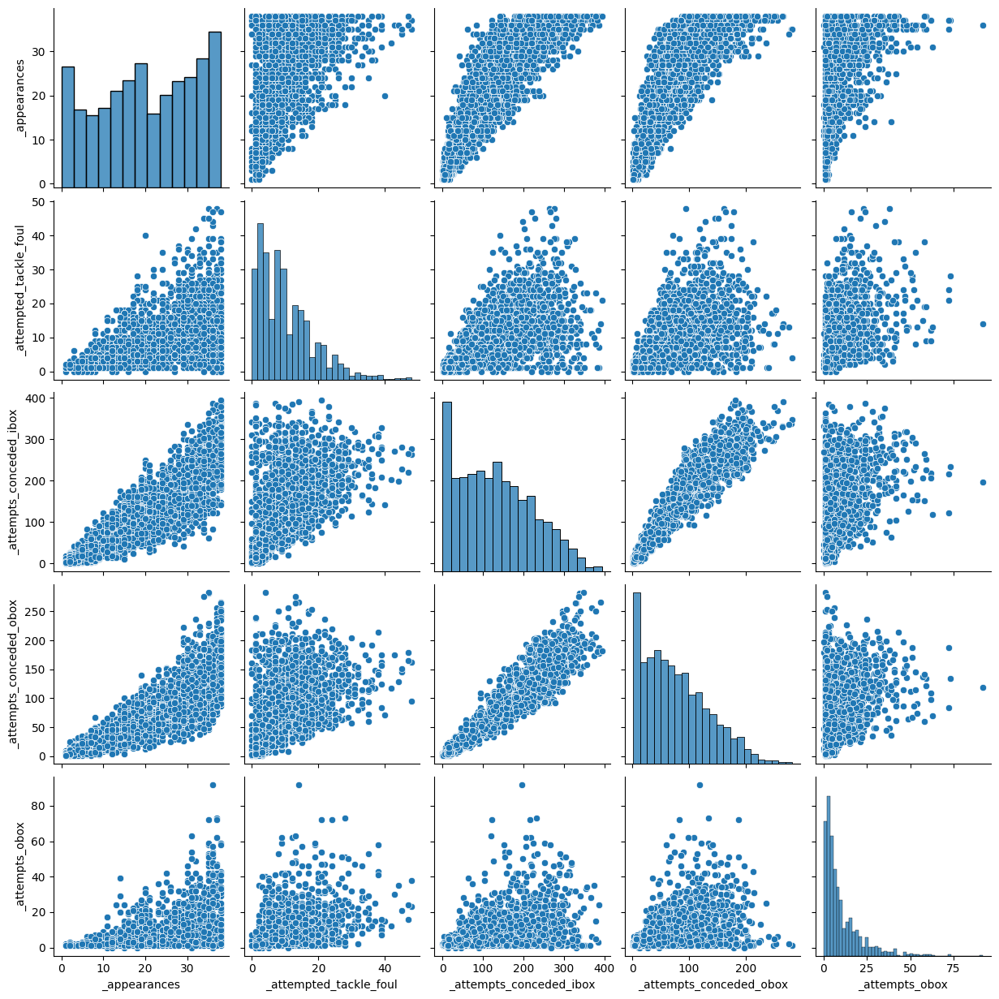

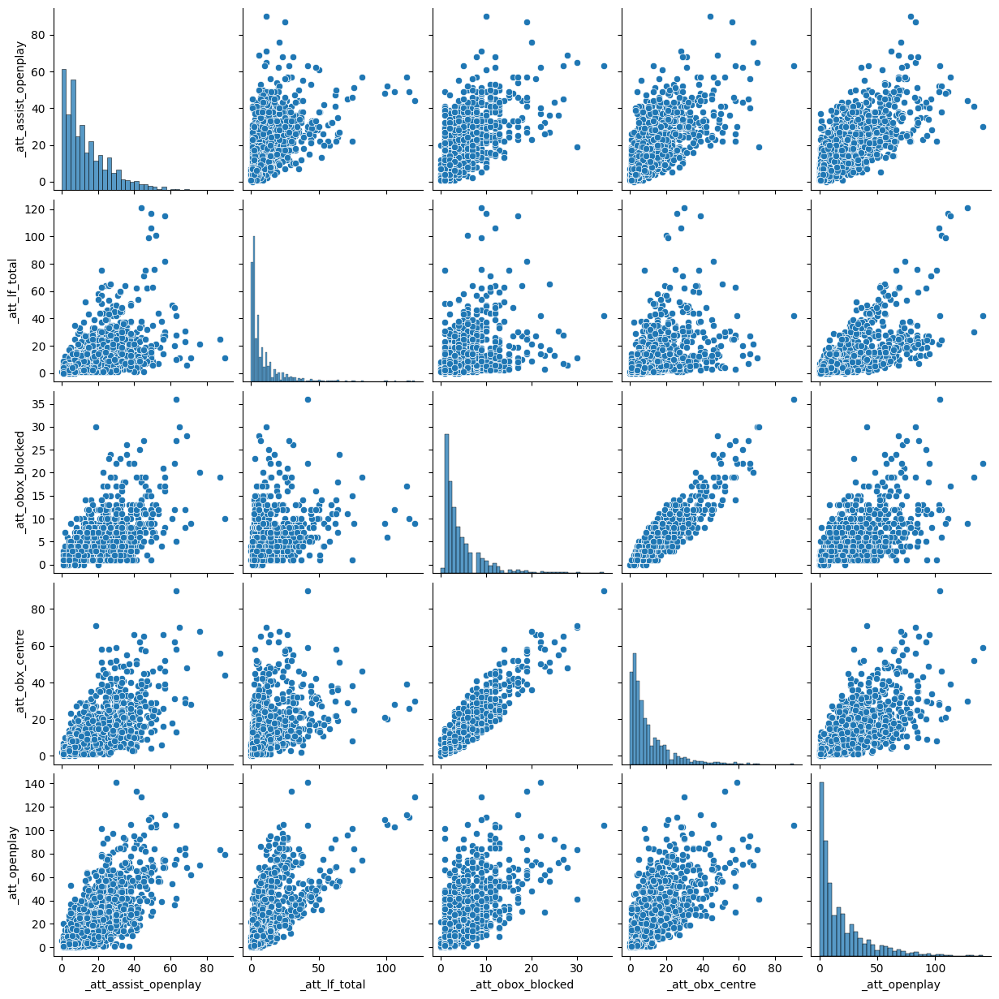

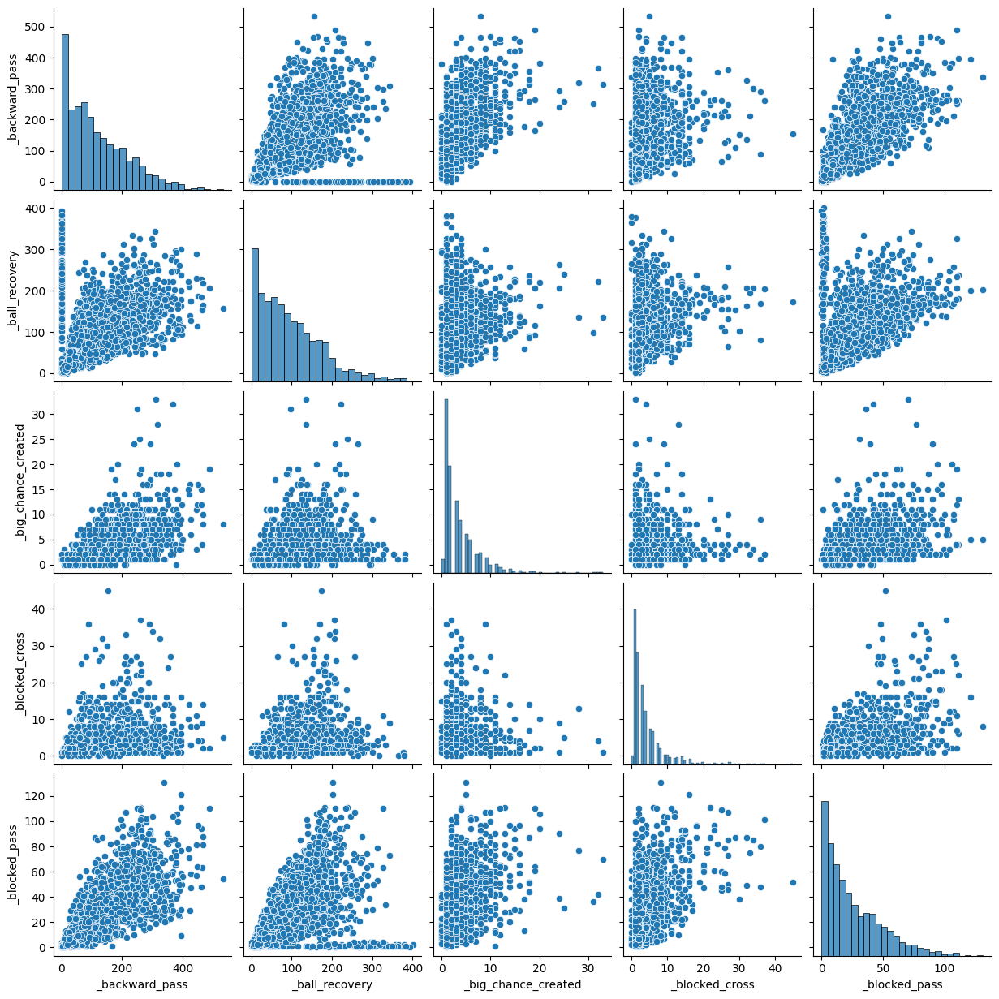

...

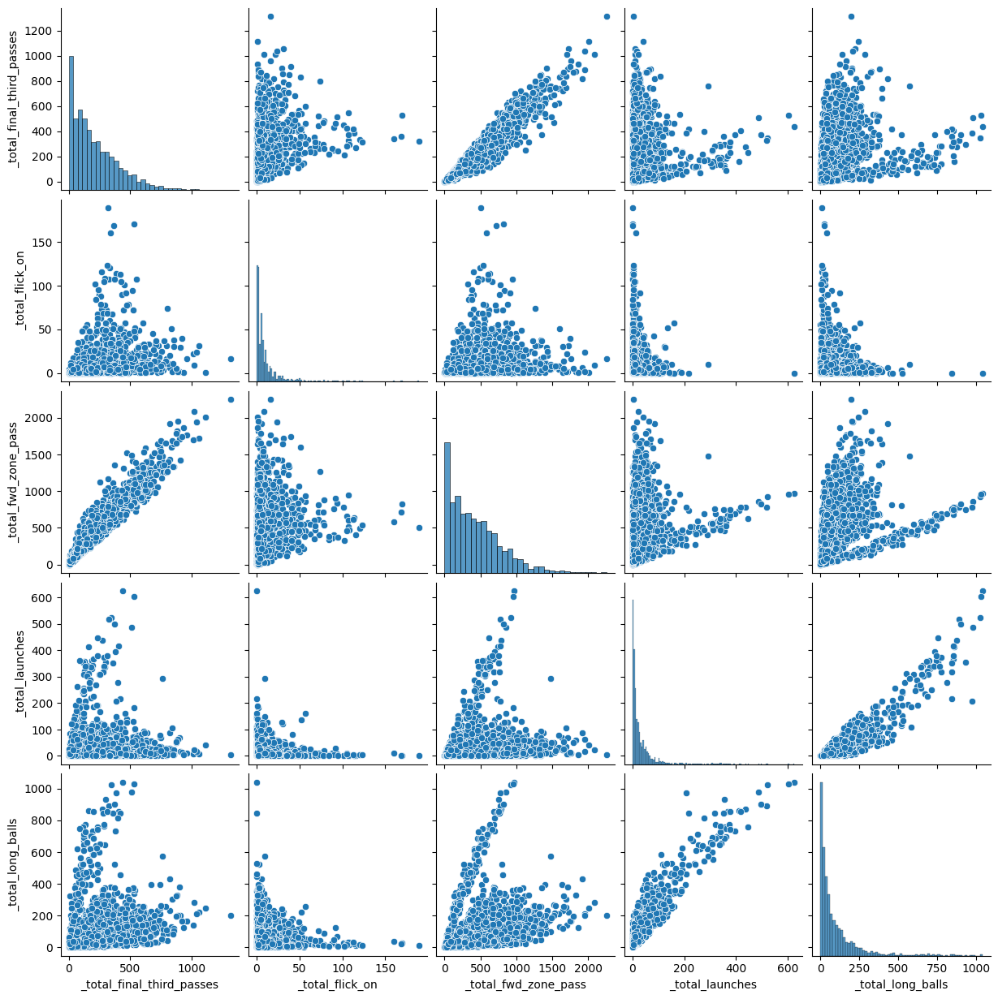

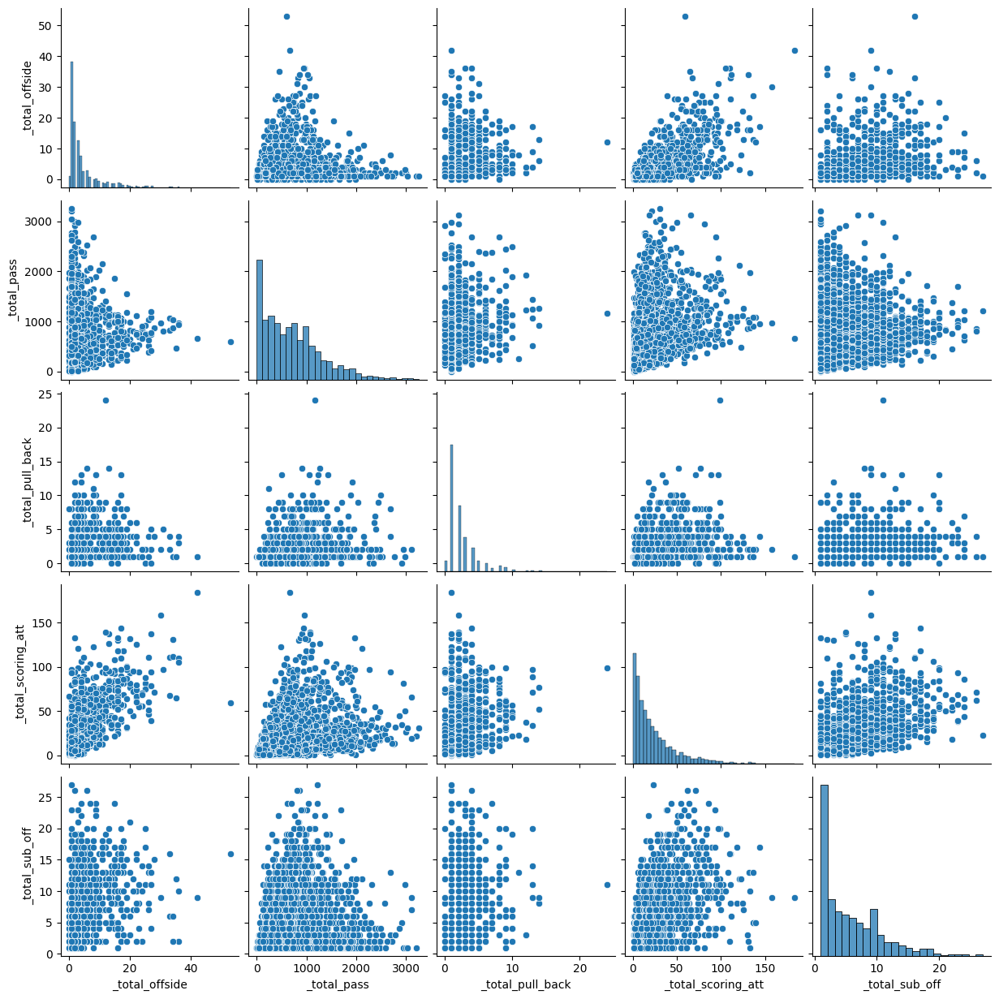

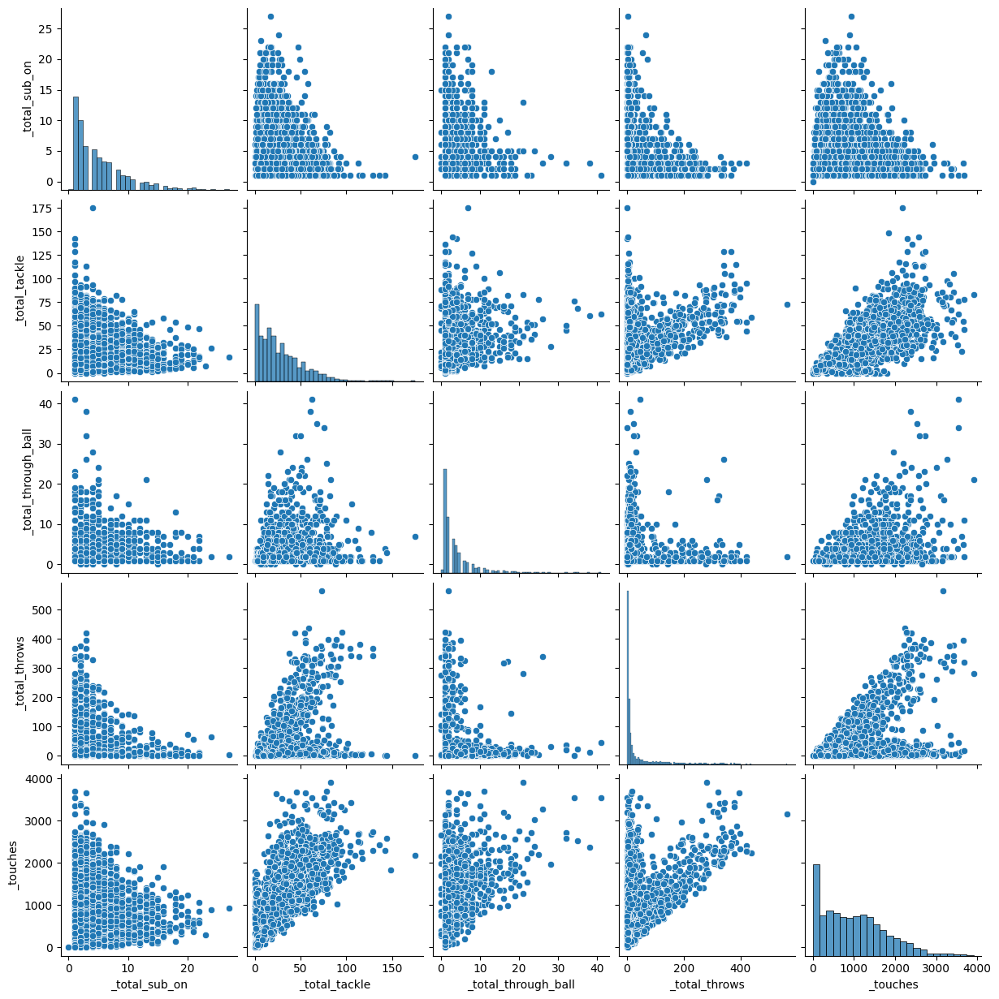

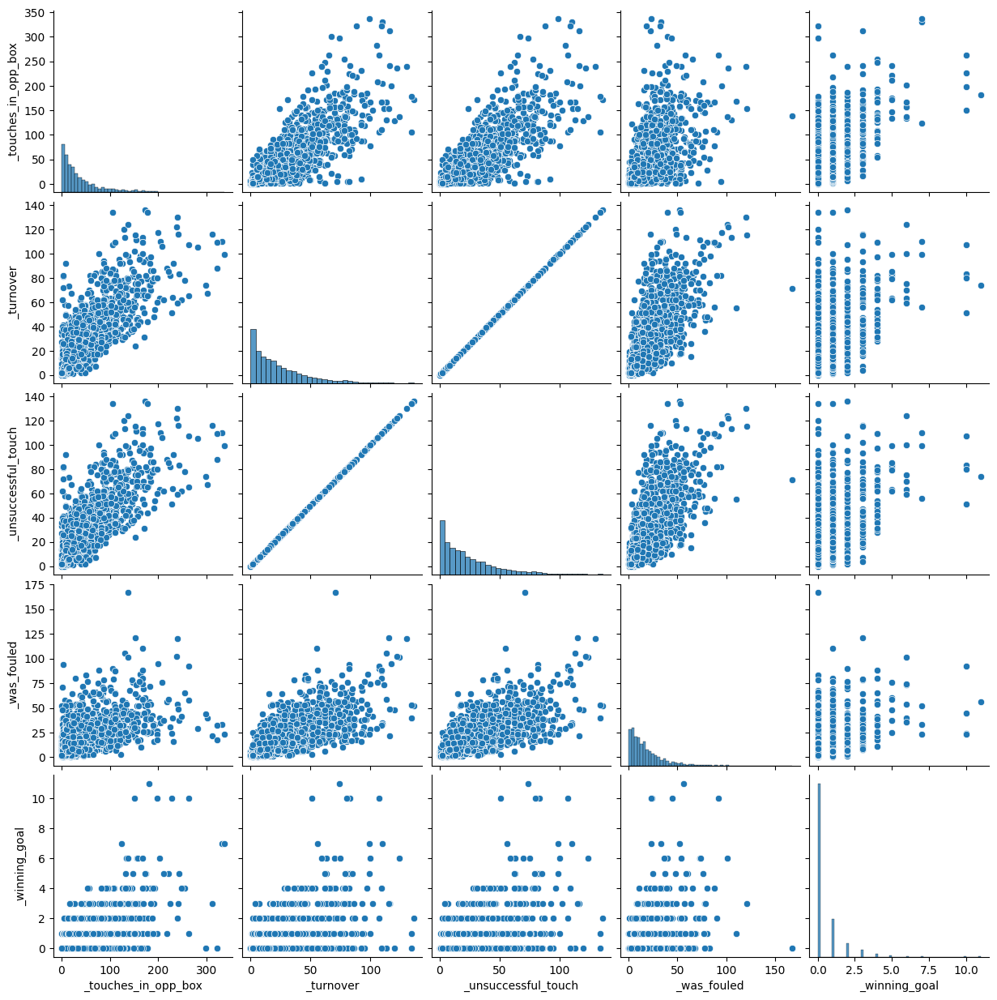

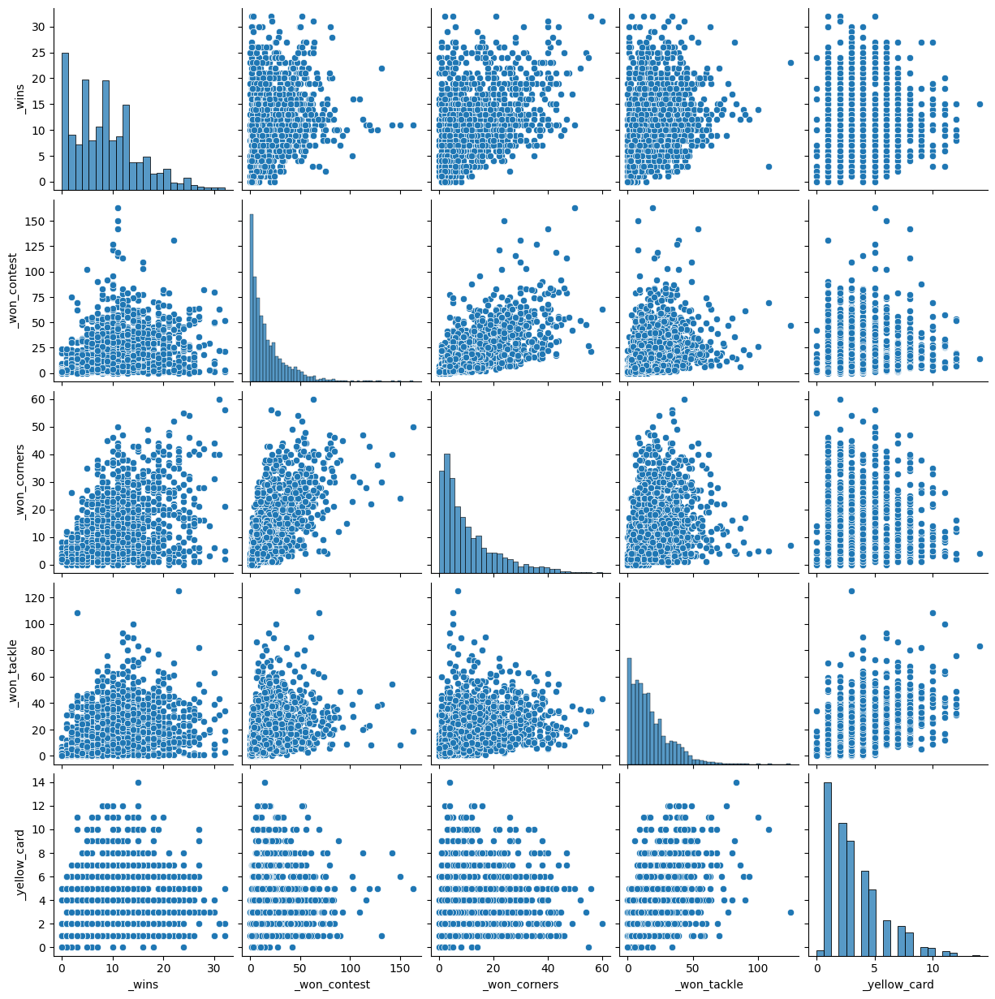

In [69]:
n = 5
df_new = df.iloc[:, 12:]
for col in range(2, df_new.shape[1]-n, n):
    loc_ =  list(range(col , col+n)) #Индексы колонок
    sns.pairplot(df_new.iloc[:, loc_])

In [70]:
df.to_csv(Path('eda_data/players_stat.csv').resolve(), index=False)